# Course Project - Photo GoodNess predictor

Machine Learning with Python: Zero to GBMs
This project is a part of Machine Learning with Python: Zero to GBMs

Let's begin by installing the required libraries.

You are required to use the training dataset to identify patterns that predict default. Apply the patterns on test dataset to identify “potential” defaulters.

In [1]:
!pip install numpy pandas matplotlib seaborn plotly --quiet

You should consider upgrading via the 'C:\Anconda\python.exe -m pip install --upgrade pip' command.


In [2]:
!pip install opendatasets xgboost graphviz lightgbm scikit-learn --upgrade --quiet

You should consider upgrading via the 'C:\Anconda\python.exe -m pip install --upgrade pip' command.


# Problem Statement
Background

We have a large collection of user-generated photos. We want to automatically pick out particularly enjoyable or impressive ones to highlight, especially travel-related, using only the meta-data associated with the images such as caption text, image dimensions and approximate location in the world.

For more information, or to view and download the data, use the following link: https://www.kaggle.com/c/PhotoQualityPrediction/overview

## Constants

In [3]:
COMPETITION = "PhotoQualityPrediction"
NAME_MAX_FEATURES = 50 #250
CAPTION_MAX_FEATURES = 50 #250
DESCRIPTION_MAX_FEATURES = 50 #250
SAMPLER_NEIGHBORS = 5
NAME_BINARY = False
DESCRIPTION_BINARY = False
CAPTION_BINARY = False
NAME_MAX_NGRAM = 3
DESCRIPTION_MAX_NGRAM = 3
CAPTION_MAX_NGRAM = 3
RATIO_EPS = 0.05

## Downloading the Data

We can download the dataset from Kaggle directly within the Jupyter notebook using the `opendatasets` library. Make sure to [accept the competition rules](https://www.kaggle.com/c/rossmann-store-sales/rules) before executing the following cell.

In [4]:
import os
import opendatasets as od
import pandas as pd
pd.set_option("display.max_columns", 120)
pd.set_option("display.max_rows", 120)

In [5]:
od.download(f'https://www.kaggle.com/c/PhotoQualityPrediction')

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: kunalghanghav
Your Kaggle Key: ········


  0%|                                                                                      | 0.00/2.81M [00:00<?, ?B/s]

100%|█████████████████████████████████████████████████████████████████████████████| 2.81M/2.81M [00:02<00:00, 1.34MB/s]



Extracting archive .\PhotoQualityPrediction/PhotoQualityPrediction.zip to .\PhotoQualityPrediction


In [25]:
os.listdir("PhotoQualityPrediction")

['example_entry.csv', 'test.csv', 'training.csv']

In [26]:
train_df = pd.read_csv(f'./PhotoQualityPrediction/training.csv')
test_df = pd.read_csv(f'./PhotoQualityPrediction/test.csv')
submission_df = pd.read_csv(f'./PhotoQualityPrediction/example_entry.csv')

In [27]:
train_df.head()

,id,latitude,longitude,width,height,size,name,description,caption,good
0,1,45,16,604,453,31,454 1659,NaN,NaN,1
1,2,21,-87,720,534,43,2068 483,687 1182 1309 2068 2107 78 89 453 1905 712 120...,830 2112 1914 792 814 1386 474 2146 1591 194 5...,0
2,3,38,-97,720,540,71,802,NaN,NaN,0
3,4,38,-122,604,453,24,NaN,924 1914 671 853 193 51 744 1437 1245 563 1410...,665 2040 792 1056 226 248 1612 1920 617 1365 1...,0
4,5,-29,24,720,540,13,1766 20,NaN,181 891 22 2123 2107 523 2080 683 1640 166 109...,0


In [28]:
test_df.head()

,id,latitude,longitude,width,height,size,name,description,caption
0,40265,34,-118,640,478,1,51 125,NaN,1481 1905 2060 2071 483
1,40266,34,-83,413,604,12,744,749 1905 36 740 1433,NaN
2,40267,42,-87,720,480,44,2102 670,2040 643 594 297 1881 737 1304 2102 2136 712 1...,807 142
3,40268,54,-2,604,453,18,1744,NaN,NaN
4,40269,20,77,604,405,60,193 944,NaN,NaN


In [29]:
submission_df.head()

,id,good
0,40265,0
1,40266,0
2,40267,0
3,40268,0
4,40269,0


## Data Exploration
Let's perform exploratory data analysis and visualization on the dataset. Study the distribution of values in each column, and their relationship with the target column `good`.

In [30]:
print(f"TRAINING SET: \n\t* Number of rows -> {train_df.shape[0]} \n\t* Number of columns -> {train_df.shape[1]}")
print(f"TEST SET: \n\t* Number of rows -> {test_df.shape[0]} \n\t* Number of columns -> {test_df.shape[1]}")

TRAINING SET: 
	* Number of rows -> 40262 
	* Number of columns -> 10
TEST SET: 
	* Number of rows -> 12000 
	* Number of columns -> 9


In [31]:
train_df.describe()

,id,latitude,longitude,width,height,size,good
count,40262.000000,40262.000000,40262.000000,40262.000000,40262.000000,40262.000000,40262.000000
mean,20132.204312,30.342854,-37.662213,587.654265,503.571581,39.872783,0.262133
std,11623.143325,20.503580,81.312267,108.089076,105.710218,42.195029,0.439800
min,1.000000,-55.000000,-175.000000,0.000000,0.000000,1.000000,0.000000
25%,10066.250000,24.000000,-98.000000,540.000000,453.000000,12.000000,0.000000
50%,20132.500000,37.000000,-76.000000,604.000000,453.000000,27.000000,0.000000
75%,30197.750000,42.000000,19.000000,640.000000,576.000000,55.000000,1.000000
max,40263.000000,72.000000,178.000000,720.000000,720.000000,1030.000000,1.000000


In [32]:
train_df.describe()

,id,latitude,longitude,width,height,size,good
count,40262.000000,40262.000000,40262.000000,40262.000000,40262.000000,40262.000000,40262.000000
mean,20132.204312,30.342854,-37.662213,587.654265,503.571581,39.872783,0.262133
std,11623.143325,20.503580,81.312267,108.089076,105.710218,42.195029,0.439800
min,1.000000,-55.000000,-175.000000,0.000000,0.000000,1.000000,0.000000
25%,10066.250000,24.000000,-98.000000,540.000000,453.000000,12.000000,0.000000
50%,20132.500000,37.000000,-76.000000,604.000000,453.000000,27.000000,0.000000
75%,30197.750000,42.000000,19.000000,640.000000,576.000000,55.000000,1.000000
max,40263.000000,72.000000,178.000000,720.000000,720.000000,1030.000000,1.000000


In [33]:
train_df.isna().sum()

id                 0
latitude           0
longitude          0
width              0
height             0
size               0
name            4798
description    27564
caption        11807
good               0
dtype: int64

In [34]:
import plotly.express as px

px.histogram(data_frame=train_df, x="good", nbins=2, color="good")

In [35]:
# Good values, with some outliers

px.histogram(data_frame=train_df, x="latitude")

In [36]:
# ~ Double gaussian distribution

px.histogram(data_frame=train_df, x="longitude")

In [37]:
# Certain format of pictures are more common

px.histogram(data_frame=train_df, x="width")

In [38]:
px.histogram(data_frame=train_df, x="height")

In [39]:
# May need to log transform this to make it more gaussian
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import numpy as np

def log_transform(series, eps=0.001):
    return np.log2(series + eps)

fig = make_subplots(rows=2,
                    cols=1,
                    subplot_titles=("Original Distribution", "Log Distribution"))
fig.add_trace(
    go.Histogram(x=train_df["size"]),
    row=1, col=1
)

fig.add_trace(
    go.Histogram(x=log_transform(train_df["size"])),
    row=2, col=1
)

fig.update_layout(height=600, width=800, title_text="Distribution of 'size' (original vs log)")
fig.show()

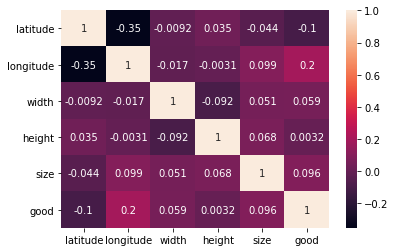

In [40]:
import seaborn as sns

# Feature are not correlated linearly, would've expected width and height to be correlated, and size

corr = train_df[["latitude", "longitude", "width", "height", "size", "good"]].corr()
sns.heatmap(corr, annot=True)

In [41]:
px.scatter(data_frame=train_df, x="height", y="width", color="good")

In [42]:
px.scatter(data_frame=train_df, x="latitude", y="longitude", color="good")

In [45]:
!pip install jovian --upgrade --quiet

You should consider upgrading via the 'C:\Anconda\python.exe -m pip install --upgrade pip' command.


In [46]:
import jovian

<IPython.core.display.Javascript object>

In [47]:
# Execute this to save new versions of the notebook
jovian.commit(project="zerotogbms-project")

<IPython.core.display.Javascript object>

[jovian] Please enter your API key ( from https://jovian.ai/ ):
API KEY: ········
[jovian] Updating notebook "ghanghavkunal/zerotogbms-project" on https://jovian.ai/
[jovian] Committed successfully! https://jovian.ai/ghanghavkunal/zerotogbms-project


'https://jovian.ai/ghanghavkunal/zerotogbms-project'

## Preprocessing and Feature Engineering

Let's take a look at the available columns, and figure out if we can create new columns or apply any useful transformations.

In [48]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40262 entries, 0 to 40261
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           40262 non-null  int64 
 1   latitude     40262 non-null  int64 
 2   longitude    40262 non-null  int64 
 3   width        40262 non-null  int64 
 4   height       40262 non-null  int64 
 5   size         40262 non-null  int64 
 6   name         35464 non-null  object
 7   description  12698 non-null  object
 8   caption      28455 non-null  object
 9   good         40262 non-null  int64 
dtypes: int64(7), object(3)
memory usage: 3.1+ MB


### Drop Id Column

ID column is not relevant to the prediction

In [49]:
def drop_columns(df, cols):
    return df.drop(cols, axis=1)

train_df = drop_columns(train_df, ["id"])

### Add Ratio as Computed Column
(standard formats are only 1:1, 4:3, 3:2, 16:9)

References https://www.adobe.com/uk/creativecloud/photography/discover/standard-photo-sizes.html

In [50]:
# Add Ratio as a Computed Column

def compute_ratio(width, height, eps=0.05):
    ratio = width / height
    ratio_class = pd.DataFrame(ratio.tolist())
    ratio_class.columns = ["rate"]
    ratio_class["ratio"] = "other"

    ratio_class.loc[(1 > ratio_class["rate"] - eps) & (1 < ratio_class["rate"] + eps), "ratio"] = "1:1"
    ratio_class.loc[(4/3 > ratio_class["rate"] - eps) & (4/3 < ratio_class["rate"] + eps), "ratio"] = "4:3"
    ratio_class.loc[(3/2 > ratio_class["rate"] - eps) & (3/2 < ratio_class["rate"] + eps), "ratio"] = "3:2"
    ratio_class.loc[(16/9 > ratio_class["rate"] - eps) & (16/9 < ratio_class["rate"] + eps), "ratio"] = "16:9"

    return ratio_class["ratio"]

train_df["ratio"] = compute_ratio(train_df["width"], train_df["height"], eps=RATIO_EPS)
px.histogram(train_df, x="ratio", color="good")

In [51]:
# Convert to One-Hot-Encoding:
from sklearn.preprocessing import OneHotEncoder

def one_hot_encode(df, col, prefix=None, drop_old=True):
    if prefix is None:
        prefix = col + "_"
        enc = OneHotEncoder(handle_unknown='ignore')

        features = enc.fit_transform(train_df["ratio"].to_numpy().reshape(-1, 1)).toarray()
        features = pd.DataFrame(features)
        features.columns = [prefix+c for c in enc.categories_[0]]

        features = pd.concat([df, features], axis=1)
    
    if drop_old:
        features.drop(col, axis=1, inplace=True)
    return features, enc, [prefix+c for c in enc.categories_[0]]

train_df, ratio_encoder, ratio_cols = one_hot_encode(train_df, "ratio")

train_df.head()

,latitude,longitude,width,height,size,name,description,caption,good,ratio_16:9,ratio_1:1,ratio_3:2,ratio_4:3,ratio_other
0,45,16,604,453,31,454 1659,NaN,NaN,1,0.0,0.0,0.0,1.0,0.0
1,21,-87,720,534,43,2068 483,687 1182 1309 2068 2107 78 89 453 1905 712 120...,830 2112 1914 792 814 1386 474 2146 1591 194 5...,0,0.0,0.0,0.0,1.0,0.0
2,38,-97,720,540,71,802,NaN,NaN,0,0.0,0.0,0.0,1.0,0.0
3,38,-122,604,453,24,NaN,924 1914 671 853 193 51 744 1437 1245 563 1410...,665 2040 792 1056 226 248 1612 1920 617 1365 1...,0,0.0,0.0,0.0,1.0,0.0
4,-29,24,720,540,13,1766 20,NaN,181 891 22 2123 2107 523 2080 683 1640 166 109...,0,0.0,0.0,0.0,1.0,0.0


### Fill Null values

Let's select fill null values in `name`, `description` and `caption` columns

In [52]:
def fill_nulls(df, cols):
    df[cols] = df[cols].fillna("")
    return df

train_df = fill_nulls(train_df, ["name", "description", "caption"])

### Shuffle Data

In [53]:
from sklearn.utils import shuffle
train_df = shuffle(train_df).reset_index(drop=True)

### Balance Classes

We will use SMOTE to generate *Synthetic Data* which will balance the number of samples for each class

In [54]:
!pip install -q --upgrade imbalanced-learn

You should consider upgrading via the 'C:\Anconda\python.exe -m pip install --upgrade pip' command.


In [57]:
train_df = train_df.sample(n=10000)

In [55]:
from imblearn.over_sampling import SMOTE, SMOTENC
from imblearn.under_sampling import RandomUnderSampler

In [58]:
sampler = SMOTENC(categorical_features=[train_df.dtypes==object], random_state=None, k_neighbors=SAMPLER_NEIGHBORS, n_jobs=-1)
#sampler = RandomUnderSampler()

X, Y = sampler.fit_resample(train_df[[f for f in train_df if f != "good"]], y=train_df["good"])
train_df = X
train_df["good"] = Y 

In [59]:
# Check it has worked:
px.histogram(data_frame=train_df, x="good", nbins=2, color="good")

### Convert Token-Columns to One-Hot-Encoding

Column `name`, `description` and `caption` columns are an array-like column in which each value is a particular **Token**, we need to extract the N most common token and keep them (for each column) in order not to generate too much columns

In [65]:
from sklearn.feature_extraction.text import CountVectorizer

In [67]:
def one_hot_encode(df, col, max_features=None, prefix=None, drop_old=False, binary=True, max_ngram=1):
    # Count-vectorize token columns :)
    cvec = CountVectorizer(input=col,
                           decode_error='strict',
                           analyzer='word',
                           max_features=max_features,
                           binary=binary,
                           ngram_range=(1, max_ngram)
                          )
    # Build a dataframe on top of this vectorized columns
    features = pd.DataFrame(cvec.fit_transform(df[col]).toarray(), columns=cvec.get_feature_names())
    # Merge original df with new columns
    features = pd.concat([df, features], axis=1)
    if prefix is None:
        prefix = col + "_"
    features.columns = [f if f not in cvec.get_feature_names() else prefix+f for f in features.columns]
    if drop_old:
        features.drop(col, axis=1, inplace=True)
    return features, cvec, [prefix+f for f in cvec.get_feature_names()]

In [69]:
train_df.head()

,latitude,longitude,width,height,size,ratio_16:9,ratio_1:1,ratio_3:2,ratio_4:3,ratio_other,good,name_1006,name_1009,name_1043,name_1048,name_1207,name_1237,name_1237 2002,name_1302,name_1393,name_1396,name_1426,name_1433,name_1435,name_1435 1499,name_1499,name_1527,name_1559,name_1560,name_1612,name_1766,name_1770,name_1782,name_1838,name_1897,name_1905,name_1976,name_20,name_2002,name_2013,name_2046,name_2046 1426,name_206,name_2068,name_2070,name_2107,name_361,name_367,name_432,name_432 1560,name_483,name_51,name_643,name_687,name_727,name_740,name_75,name_907,name_944,name_968,...,description_737,description_740,description_744,description_78,description_792,description_807,description_830,description_853,description_876,description_924,caption_1011,caption_1092,caption_1104,caption_1120,caption_1130,caption_1257,caption_128,caption_1302,caption_1309,caption_1318,caption_1333,caption_1348,caption_1363,caption_1365,caption_1369,caption_161,caption_1749,caption_1903,caption_1905,caption_1912,caption_1914,caption_1920,caption_1933,caption_2029,caption_2054,caption_2064,caption_2076,caption_2080,caption_2084,caption_2107,caption_2144,caption_22,caption_276,caption_297,caption_36,caption_483,caption_51,caption_540,caption_687,caption_712,caption_740,caption_763,caption_78,caption_792,caption_807,caption_830,caption_853,caption_875,caption_876,caption_891
0,36,-120,328,230,82,0.0,0.0,0.0,0.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,36,138,720,480,11,0.0,0.0,1.0,0.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,-27,133,453,604,33,0.0,0.0,0.0,0.0,1.0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,43,-89,604,453,10,0.0,0.0,0.0,1.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,13,-70,604,403,47,0.0,0.0,1.0,0.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [70]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Updating notebook "ghanghavkunal/zerotogbms-project" on https://jovian.ai/
[jovian] Committed successfully! https://jovian.ai/ghanghavkunal/zerotogbms-project


'https://jovian.ai/ghanghavkunal/zerotogbms-project'

### Input and Target Columns

Let's select the columns that we'll use for training.

In [71]:
print(f"TRAINING SET: \n\t* Number of rows -> {train_df.shape[0]} \n\t* Number of columns -> {train_df.shape[1]}")

TRAINING SET: 
	* Number of rows -> 14822 
	* Number of columns -> 161


In [72]:
input_cols = [f for f in train_df.columns if f not in ['good']]

target_col = 'good'

categorical_cols = name_cols + description_cols + caption_cols
numeric_cols = [f for f in train_df.columns if f not in categorical_cols and f != target_col]

### Impute missing numerical data

In [73]:
train_df.isna().sum().reset_index().sort_values(0, ascending=False)

,index,0
0,latitude,0
81,description_1933,0
103,description_744,0
104,description_78,0
105,description_792,0
...,...,...
55,name_740,0
56,name_75,0
57,name_907,0
58,name_944,0


### Scale Numeric Values

Let's scale numeric values to the 0 to 1 range.

In [74]:
from sklearn.preprocessing import MinMaxScaler

In [75]:
scaler = MinMaxScaler().fit(train_df[numeric_cols+categorical_cols])

In [76]:
train_df[numeric_cols+categorical_cols] = scaler.transform(train_df[numeric_cols+categorical_cols])

In [77]:
train_df = train_df.reset_index(drop=True)

In [78]:
train_df.head()

,latitude,longitude,width,height,size,ratio_16:9,ratio_1:1,ratio_3:2,ratio_4:3,ratio_other,good,name_1006,name_1009,name_1043,name_1048,name_1207,name_1237,name_1237 2002,name_1302,name_1393,name_1396,name_1426,name_1433,name_1435,name_1435 1499,name_1499,name_1527,name_1559,name_1560,name_1612,name_1766,name_1770,name_1782,name_1838,name_1897,name_1905,name_1976,name_20,name_2002,name_2013,name_2046,name_2046 1426,name_206,name_2068,name_2070,name_2107,name_361,name_367,name_432,name_432 1560,name_483,name_51,name_643,name_687,name_727,name_740,name_75,name_907,name_944,name_968,...,description_737,description_740,description_744,description_78,description_792,description_807,description_830,description_853,description_876,description_924,caption_1011,caption_1092,caption_1104,caption_1120,caption_1130,caption_1257,caption_128,caption_1302,caption_1309,caption_1318,caption_1333,caption_1348,caption_1363,caption_1365,caption_1369,caption_161,caption_1749,caption_1903,caption_1905,caption_1912,caption_1914,caption_1920,caption_1933,caption_2029,caption_2054,caption_2064,caption_2076,caption_2080,caption_2084,caption_2107,caption_2144,caption_22,caption_276,caption_297,caption_36,caption_483,caption_51,caption_540,caption_687,caption_712,caption_740,caption_763,caption_78,caption_792,caption_807,caption_830,caption_853,caption_875,caption_876,caption_891
0,0.728,0.155807,0.455556,0.319444,0.078717,0.0,0.0,0.0,0.0,1.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.728,0.886686,1.000000,0.666667,0.009718,0.0,0.0,1.0,0.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.224,0.872521,0.629167,0.838889,0.031098,0.0,0.0,0.0,0.0,1.0,0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.784,0.243626,0.838889,0.629167,0.008746,0.0,0.0,0.0,1.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.544,0.297450,0.838889,0.559722,0.044704,0.0,0.0,1.0,0.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Utils function for Model Selection

In [79]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import validation_curve

def plot_validation_curve(estimator, X, Y, param_name, param_range, title=None,
                          scoring="accuracy", axes=None, ylim=None, cv=None,
                          n_jobs=-1, logscale=True):
    if axes is None:
        _, axes = plt.subplots(1, 1, figsize=(20, 8))

    if title is None:
        axes.set_title(f"Validation Curve - {param_name}")
    else:
        axes[0].set_title(title)
    if ylim is not None:
        axes[0].set_ylim(*ylim)
    axes.set_xlabel(param_name)
    axes.set_ylabel(f"Score - {scoring}")

    train_scores, test_scores = validation_curve(
        estimator, X, Y, param_name=param_name, param_range=param_range,
        scoring=scoring, n_jobs=-1, cv=cv)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    axes.grid()
    axes.set_xlabel(param_name)
    axes.set_ylabel(scoring)
    axes.set_ylim(0.0, 1.1)

    lw = 2
    if logscale:
        axes.semilogx(param_range, train_scores_mean, label="Training score",
                color="darkorange", lw=lw)
    else:
        axes.plot(param_range, train_scores_mean, label="Training score",
                  color="darkorange", lw=lw)
    axes.fill_between(param_range, train_scores_mean - train_scores_std,
                    train_scores_mean + train_scores_std, alpha=0.2,
                    color="darkorange", lw=lw)
    if logscale:
        axes.semilogx(param_range, test_scores_mean, label="Cross-validation score",
                  color="navy", lw=lw)
    else:
        axes.plot(param_range, test_scores_mean, label="Cross-validation score",
                  color="navy", lw=lw)

    axes.fill_between(param_range, test_scores_mean - test_scores_std,
                    test_scores_mean + test_scores_std, alpha=0.2,
                    color="navy", lw=lw)
  
    axes.vlines(x=param_range[list(test_scores_mean).index(max(test_scores_mean))], ymin=0, ymax=max(test_scores_mean), colors='red', linestyles='solid', label='maximum')
    axes.set_xticks(ticks=param_range)
    axes.set_xticklabels(param_range, rotation=90)

    axes.legend(loc="best")
    return plt

# E.g:
# param_range = np.linspace(2, 50, 10, dtype=np.int)
# param_name = "max_depth"
# scoring="accuracy"
# plot_validation_curve(estimator=gscv2.best_estimator_, title=None,
#                       X=train_df[input_cols], Y=train_df[target_col], axes=None,
#                       cv=3, param_name=param_name, param_range=param_range,
#                       scoring="accuracy", ylim=None)
# plt.show()

In [80]:
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit

def plot_learning_curve(estimator, title, X, Y, axes=None, ylim=None, cv=None,
                        n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 20)):

    if axes is None:
        _, axes = plt.subplots(3, 1, figsize=(20, 15))

    axes[0].set_title(title)
    if ylim is not None:
        axes[0].set_ylim(*ylim)
    axes[0].set_xlabel("Training examples")
    axes[0].set_ylabel("Score")

    train_sizes, train_scores, test_scores, fit_times, _ = \
        learning_curve(estimator, X, Y, cv=cv, n_jobs=n_jobs,
                       train_sizes=train_sizes,
                       return_times=True)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    fit_times_mean = np.mean(fit_times, axis=1)
    fit_times_std = np.std(fit_times, axis=1)

    # Plot learning curve
    axes[0].grid()
    axes[0].fill_between(train_sizes, train_scores_mean - train_scores_std,
                         train_scores_mean + train_scores_std, alpha=0.1,
                         color="r")
    axes[0].fill_between(train_sizes, test_scores_mean - test_scores_std,
                         test_scores_mean + test_scores_std, alpha=0.1,
                         color="g")
    axes[0].plot(train_sizes, train_scores_mean, 'o-', color="r",
                 label="Training score")
    axes[0].plot(train_sizes, test_scores_mean, 'o-', color="g",
                 label="Cross-validation score")
    axes[0].legend(loc="best")

    # Plot n_samples vs fit_times
    axes[1].grid()
    axes[1].plot(train_sizes, fit_times_mean, 'o-')
    axes[1].fill_between(train_sizes, fit_times_mean - fit_times_std,
                         fit_times_mean + fit_times_std, alpha=0.1)
    axes[1].set_xlabel("Training examples")
    axes[1].set_ylabel("fit_times")
    axes[1].set_title("Scalability of the model")

    # Plot fit_time vs score
    axes[2].grid()
    axes[2].plot(fit_times_mean, test_scores_mean, 'o-')
    axes[2].fill_between(fit_times_mean, test_scores_mean - test_scores_std,
                         test_scores_mean + test_scores_std, alpha=0.1)
    axes[2].set_xlabel("fit_times")
    axes[2].set_ylabel("Score")
    axes[2].set_title("Performance of the model")

    return plt

# E.g:
# fig, axes = plt.subplots(3, 1, figsize=(10, 15))
# title = "Learning Curve for Decision Tree"
# # Cross validation with 100 iterations to get smoother mean test and train
# # score curves, each time with 20% data randomly selected as a validation set.
# cv = ShuffleSplit(n_splits=100, test_size=0.2, random_state=0)
# plot_learning_curve(estimator=gscv2.best_estimator_, title=title, X=train_df[input_cols], Y=train_df[target_col], axes=axes[:], cv=3, n_jobs=-1)

## Logistic Regression

In [81]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import f1_score, classification_report, accuracy_score, confusion_matrix
import numpy as np

## Decision Tree

In [82]:
from sklearn.tree import DecisionTreeClassifier

### Validation Curves for Hyperparameters

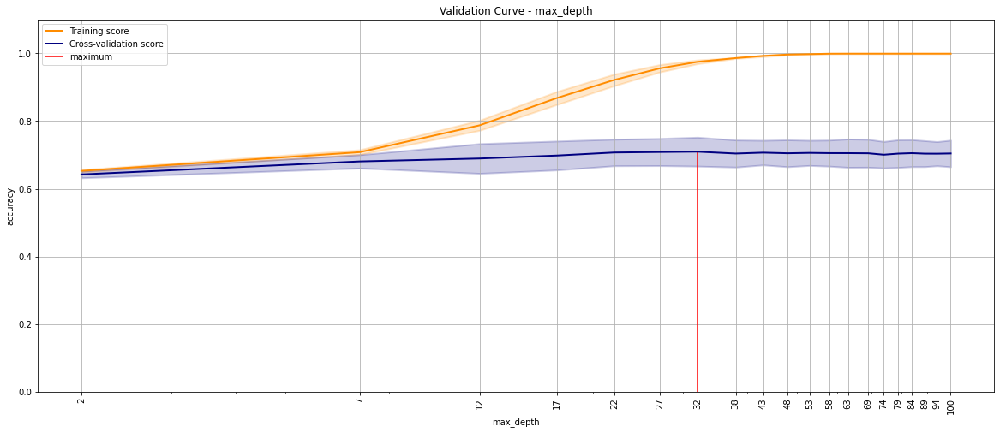

In [83]:
param_range = np.linspace(2, 100, 20, dtype=np.int)
param_name = "max_depth"
scoring="accuracy"
estimator = DecisionTreeClassifier()

plot_validation_curve(estimator=estimator, title=None,
                      X=train_df[input_cols], Y=train_df[target_col], axes=None,
                      cv=3, param_name=param_name, param_range=param_range,
                      scoring="accuracy", ylim=None)
plt.show()

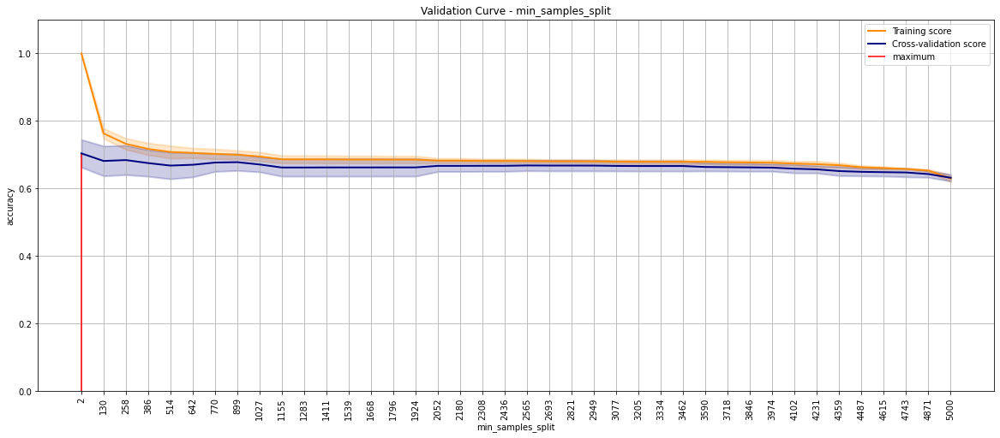

In [84]:
param_range = np.linspace(2, 5000, 40, dtype=np.int)
param_name = "min_samples_split"
scoring="accuracy"
estimator = DecisionTreeClassifier()

plot_validation_curve(estimator=estimator, title=None,
                      X=train_df[input_cols], Y=train_df[target_col], axes=None,
                      cv=3, param_name=param_name, param_range=param_range,
                      scoring="accuracy", ylim=None, logscale=False)
plt.show()

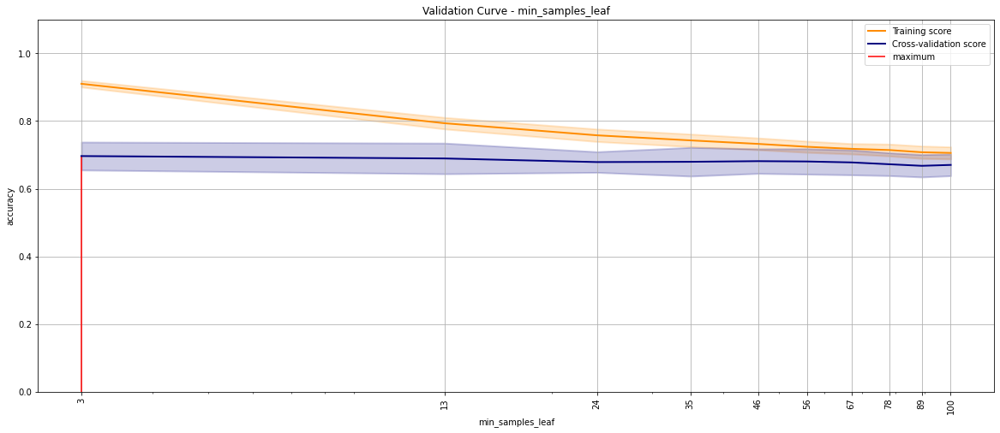

In [85]:
param_range = np.linspace(3, 100, 10, dtype=np.int)
param_name = "min_samples_leaf"
scoring="accuracy"
estimator = DecisionTreeClassifier()

plot_validation_curve(estimator=estimator, title=None,
                      X=train_df[input_cols], Y=train_df[target_col], axes=None,
                      cv=3, param_name=param_name, param_range=param_range,
                      scoring="accuracy", ylim=None)
plt.show()

### GridSearchCV

In [87]:
param_grid = {
  "max_depth": np.linspace(5, 30, 5, dtype=np.int),
  "min_samples_split": np.linspace(100, 10000, 15, dtype=np.int),
  'min_samples_leaf': np.linspace(30, 120, 10, dtype=np.int)
  #"max_features": ["auto", "sqrt"] + [i for i in np.linspace(32, 150, 5, dtype=np.int)]
}

gscv2 = GridSearchCV(DecisionTreeClassifier(), param_grid=param_grid, scoring="accuracy", n_jobs=-1, refit=True, cv=3, verbose=3, return_train_score=True)

gscv2.fit(train_df[input_cols], train_df[target_col])

pd.DataFrame(gscv2.cv_results_).sort_values("rank_test_score").head(10)

Fitting 3 folds for each of 750 candidates, totalling 2250 fits


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
630,0.473066,0.073036,0.018618,0.005777,30,50,100,"{'max_depth': 30, 'min_samples_leaf': 50, 'min...",0.629630,0.707144,0.703644,0.680139,0.035744,1,0.756502,0.716223,0.715139,0.729288,0.019249
480,0.375660,0.023734,0.016627,0.005167,23,50,100,"{'max_depth': 23, 'min_samples_leaf': 50, 'min...",0.629630,0.707144,0.703644,0.680139,0.035744,1,0.756502,0.716223,0.715139,0.729288,0.019249
465,0.362364,0.009507,0.011635,0.000470,23,40,100,"{'max_depth': 23, 'min_samples_leaf': 40, 'min...",0.622344,0.718883,0.699190,0.680139,0.041651,3,0.760247,0.723307,0.720806,0.734787,0.018032
615,0.426857,0.027506,0.013631,0.002049,30,40,100,"{'max_depth': 30, 'min_samples_leaf': 40, 'min...",0.622141,0.718883,0.699190,0.680071,0.041744,4,0.760247,0.723307,0.720806,0.734787,0.018032
330,0.462095,0.091979,0.013298,0.001880,17,50,100,"{'max_depth': 17, 'min_samples_leaf': 50, 'min...",0.629630,0.707144,0.702227,0.679667,0.035439,5,0.756502,0.716223,0.712710,0.728478,0.019868
645,0.487361,0.006219,0.021610,0.006781,30,60,100,"{'max_depth': 30, 'min_samples_leaf': 60, 'min...",0.626391,0.710180,0.702227,0.679599,0.037764,6,0.745269,0.711264,0.709472,0.722002,0.016469
495,0.327789,0.006325,0.011636,0.000469,23,60,100,"{'max_depth': 23, 'min_samples_leaf': 60, 'min...",0.626391,0.710180,0.702227,0.679599,0.037764,6,0.745269,0.711264,0.709472,0.722002,0.016469
315,0.346074,0.020777,0.012300,0.000939,17,40,100,"{'max_depth': 17, 'min_samples_leaf': 40, 'min...",0.622141,0.717871,0.697166,0.679059,0.041125,8,0.760247,0.723307,0.717466,0.733673,0.018941
345,0.498001,0.124546,0.014630,0.003088,17,60,100,"{'max_depth': 17, 'min_samples_leaf': 60, 'min...",0.626391,0.710180,0.698785,0.678452,0.037105,9,0.745269,0.711264,0.705728,0.720753,0.017482
360,0.453118,0.064045,0.016289,0.004975,17,70,100,"{'max_depth': 17, 'min_samples_leaf': 70, 'min...",0.623558,0.703704,0.702429,0.676564,0.037484,10,0.739196,0.706204,0.708561,0.717987,0.015028


### Learning Curve

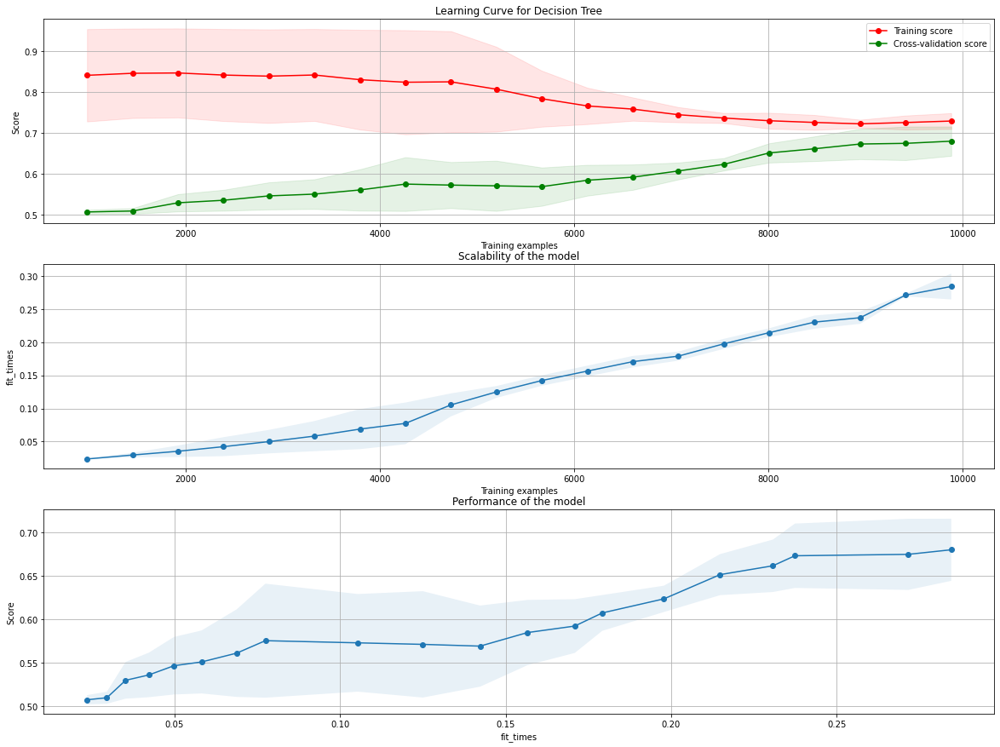

In [88]:
title = "Learning Curve for Decision Tree"

estimator = gscv2.best_estimator_
plot_learning_curve(estimator=estimator, title=title, X=train_df[input_cols],
                    Y=train_df[target_col], axes=None, cv=3, n_jobs=-1)

plt.show()

### Feature Importance

In [89]:
model = gscv2.best_estimator_

importance_df = pd.DataFrame({
    'feature': input_cols,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

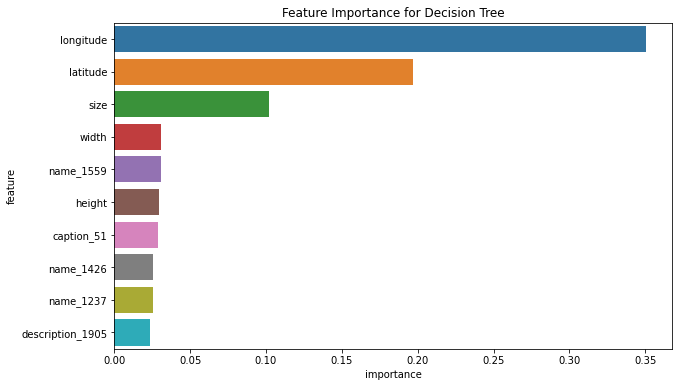

In [90]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.title('Feature Importance for Decision Tree')
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

In [91]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Updating notebook "ghanghavkunal/zerotogbms-project" on https://jovian.ai/
[jovian] Committed successfully! https://jovian.ai/ghanghavkunal/zerotogbms-project


'https://jovian.ai/ghanghavkunal/zerotogbms-project'

## Gradient Boosting

We're now ready to train our gradient boosting machine (GBM) model. Here's how a GBM model works:

1. The average value of the target column and uses as an initial prediction every input.
2. The residuals (difference) of the predictions with the targets are computed.
3. A decision tree of limited depth is trained to **predict just the residuals** for each input.
4. Predictions from the decision tree are scaled using a parameter called the learning rate (this prevents overfitting)
5. Scaled predictions fro the tree are added to the previous predictions to obtain the new and improved predictions.
6. Steps 2 to 5 are repeated to create new decision trees, each of which is trained to predict just the residuals from the previous prediction.

The term "gradient" refers to the fact that each decision tree is trained with the purpose of reducing the loss from the previous iteration (similar to gradient descent). The term "boosting" refers the general technique of training new models to improve the results of an existing model. 

> **EXERCISE**: Can you describe in your own words how a gradient boosting machine is different from a random forest?


For a mathematical explanation of gradient boosting, check out the following resources:

- [XGBoost Documentation](https://xgboost.readthedocs.io/en/latest/tutorials/model.html)
- [Video Tutorials on StatQuest](https://www.youtube.com/watch?v=3CC4N4z3GJc&list=PLblh5JKOoLUJjeXUvUE0maghNuY2_5fY6)

Here's a visual representation of gradient boosting:

![](https://miro.medium.com/max/560/1*85QHtH-49U7ozPpmA5cAaw.png)


In [92]:
from xgboost import XGBClassifier

### Validation Curves for Hyperparameters

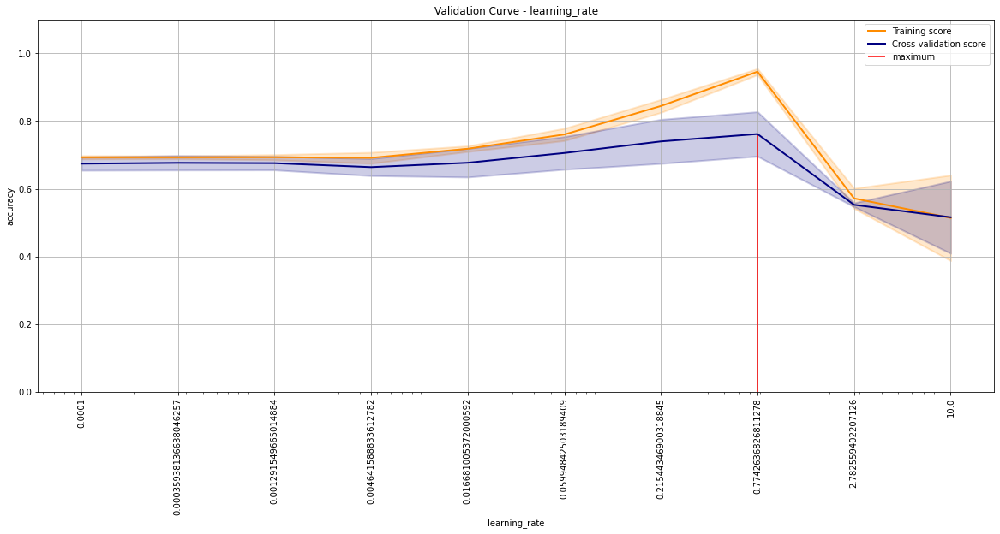

In [93]:
param_range = np.logspace(-4, 1, 10)
param_name = "learning_rate"
scoring="accuracy"
estimator = XGBClassifier(use_label_encoder=False, n_jobs=-1, objective="binary:logitraw", eval_metric="error")

plot_validation_curve(estimator=estimator, title=None,
                      X=train_df[input_cols], Y=train_df[target_col], axes=None,
                      cv=3, param_name=param_name, param_range=param_range,
                      scoring="accuracy", ylim=None)
plt.show()

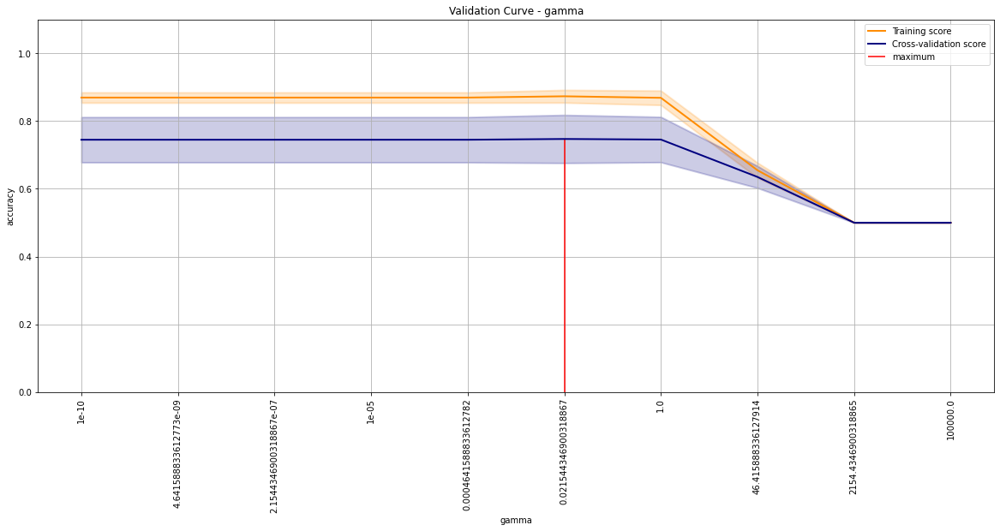

In [94]:
param_range = np.logspace(-10, 5, 10)
param_name = "gamma"
scoring="accuracy"
estimator = XGBClassifier(use_label_encoder=False, n_jobs=-1, objective="binary:logitraw", eval_metric="error")

plot_validation_curve(estimator=estimator, title=None,
                      X=train_df[input_cols], Y=train_df[target_col], axes=None,
                      cv=3, param_name=param_name, param_range=param_range,
                      scoring="accuracy", ylim=None)
plt.show()

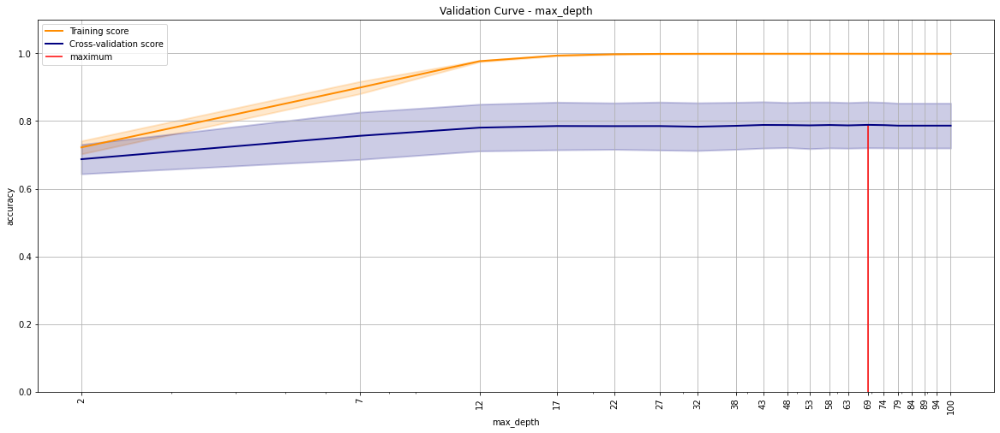

In [96]:
param_range = np.linspace(2, 100, 20, dtype=np.int)
param_name = "max_depth"
scoring="accuracy"
estimator = XGBClassifier(use_label_encoder=False, n_jobs=-1, objective="binary:logitraw", eval_metric="error")

plot_validation_curve(estimator=estimator, title=None,
                      X=train_df[input_cols], Y=train_df[target_col], axes=None,
                      cv=3, param_name=param_name, param_range=param_range,
                      scoring="accuracy", ylim=None)
plt.show()

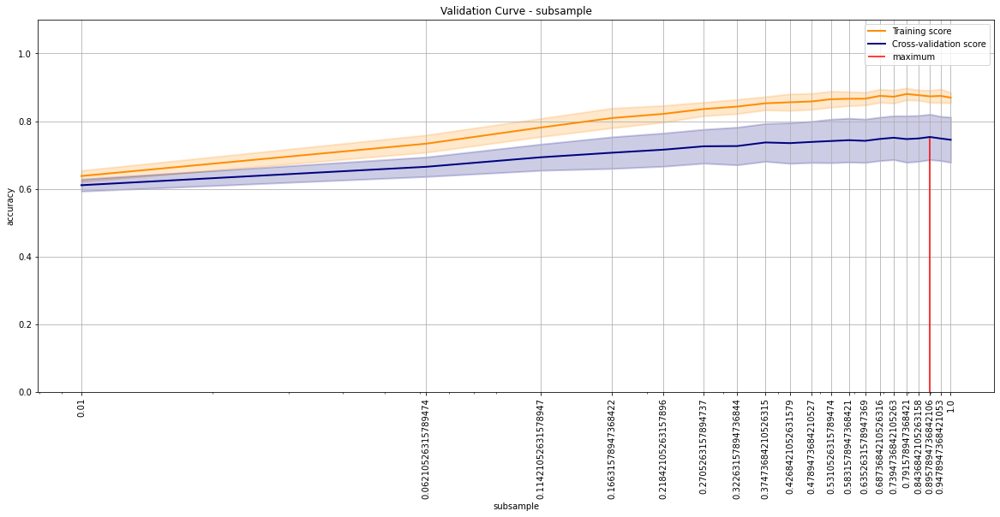

In [97]:
param_range = np.linspace(0.01, 1, 20)
param_name = "subsample"
scoring="accuracy"
estimator = XGBClassifier(use_label_encoder=False, n_jobs=-1, objective="binary:logitraw", eval_metric="error")

plot_validation_curve(estimator=estimator, title=None,
                      X=train_df[input_cols], Y=train_df[target_col], axes=None,
                      cv=3, param_name=param_name, param_range=param_range,
                      scoring="accuracy", ylim=None)
plt.show()

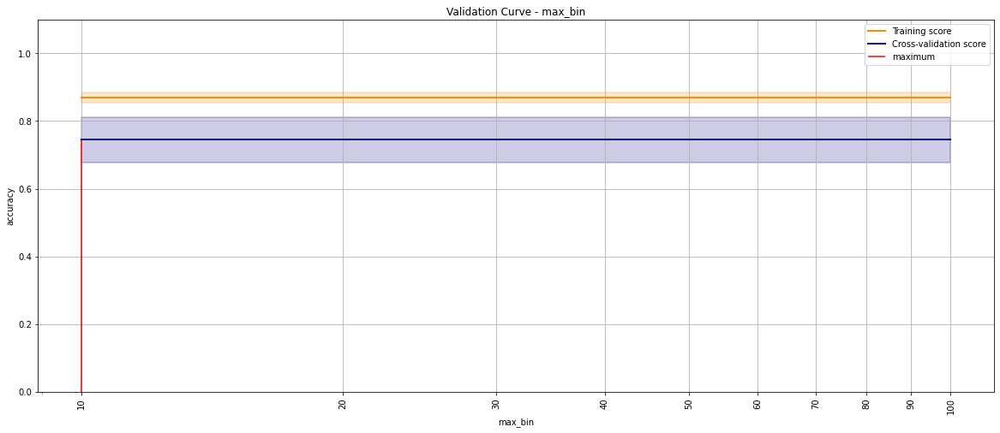

In [98]:
param_range = np.linspace(10, 100, 10, dtype=np.int)
param_name = "max_bin"
scoring="accuracy"
estimator = XGBClassifier(use_label_encoder=False, n_jobs=-1, objective="binary:logitraw", eval_metric="error")

plot_validation_curve(estimator=estimator, title=None,
                      X=train_df[input_cols], Y=train_df[target_col], axes=None,
                      cv=3, param_name=param_name, param_range=param_range,
                      scoring="accuracy", ylim=None)
plt.show()

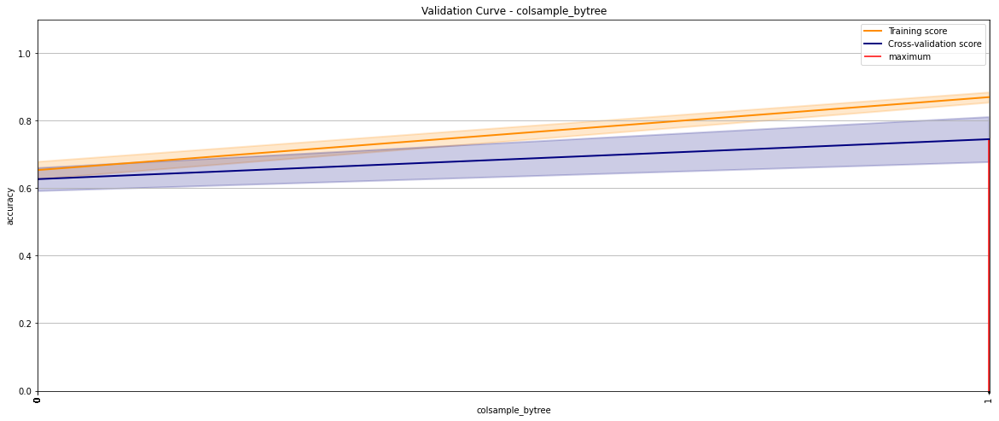

In [99]:
param_range = np.linspace(0.01, 1, 10, dtype=np.int)
param_name = "colsample_bytree"
scoring="accuracy"
estimator = XGBClassifier(use_label_encoder=False, n_jobs=-1, objective="binary:logitraw", eval_metric="error")

plot_validation_curve(estimator=estimator, title=None,
                      X=train_df[input_cols], Y=train_df[target_col], axes=None,
                      cv=3, param_name=param_name, param_range=param_range,
                      scoring="accuracy", ylim=None)
plt.show()

In [100]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Updating notebook "ghanghavkunal/zerotogbms-project" on https://jovian.ai/
[jovian] Committed successfully! https://jovian.ai/ghanghavkunal/zerotogbms-project


'https://jovian.ai/ghanghavkunal/zerotogbms-project'

### GridSearchCV

In [111]:
param_grid = {
  "learning_rate": np.logspace(-0.1, 0.4, 5),
  "gamma": [1],
  "max_depth": np.linspace(4, 12, 3, dtype=np.int),
  "subsample": np.linspace(0.4, 1, 3),
  "colsample_bytree": [1]
}

model = XGBClassifier(use_label_encoder=False, n_jobs=-1, objective="binary:logitraw", eval_metric="logloss")
gscv3 = GridSearchCV(model, param_grid=param_grid, scoring="accuracy", n_jobs=-1, refit=True, cv=3, verbose=3, return_train_score=True)

gscv3.fit(train_df[input_cols], train_df[target_col])

pd.DataFrame(gscv3.cv_results_).sort_values("rank_test_score")

Fitting 3 folds for each of 45 candidates, totalling 135 fits


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_colsample_bytree,param_gamma,param_learning_rate,param_max_depth,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
8,25.401359,3.244091,0.038896,0.008021,1,1,0.794328,12,1,"{'colsample_bytree': 1, 'gamma': 1, 'learning_...",0.664643,0.806719,0.813360,0.761574,0.068594,1,0.980670,0.971966,0.974499,0.975712,0.003655
7,29.457171,0.173532,0.038565,0.008785,1,1,0.794328,12,0.7,"{'colsample_bytree': 1, 'gamma': 1, 'learning_...",0.675774,0.800445,0.797571,0.757930,0.058105,2,0.992713,0.988362,0.987250,0.989441,0.002358
17,29.145671,4.143233,0.037900,0.011284,1,1,1.05925,12,1,"{'colsample_bytree': 1, 'gamma': 1, 'learning_...",0.671726,0.788504,0.809514,0.756582,0.060612,3,0.990183,0.964578,0.985732,0.980164,0.011170
14,15.642805,0.598408,0.026597,0.002618,1,1,1.05925,8,1,"{'colsample_bytree': 1, 'gamma': 1, 'learning_...",0.674965,0.790123,0.801012,0.755367,0.057026,4,0.963566,0.947576,0.969844,0.960329,0.009375
5,17.875829,0.243869,0.033910,0.007329,1,1,0.794328,8,1,"{'colsample_bytree': 1, 'gamma': 1, 'learning_...",0.669095,0.792147,0.804049,0.755097,0.061006,5,0.969740,0.937456,0.947379,0.951525,0.013502
4,20.442960,0.766401,0.034242,0.009715,1,1,0.794328,8,0.7,"{'colsample_bytree': 1, 'gamma': 1, 'learning_...",0.660797,0.797207,0.802834,0.753613,0.065671,6,0.979860,0.966097,0.968529,0.971495,0.005998
13,18.454615,0.089605,0.036901,0.004072,1,1,1.05925,8,0.7,"{'colsample_bytree': 1, 'gamma': 1, 'learning_...",0.669702,0.788100,0.788057,0.748620,0.055803,7,0.986641,0.975306,0.976624,0.979524,0.005061
26,26.575217,1.612493,0.033577,0.000940,1,1,1.41254,12,1,"{'colsample_bytree': 1, 'gamma': 1, 'learning_...",0.668893,0.783040,0.793320,0.748418,0.056389,8,0.991802,0.982593,0.986440,0.986945,0.003777
16,27.592495,0.810946,0.036569,0.006219,1,1,1.05925,12,0.7,"{'colsample_bytree': 1, 'gamma': 1, 'learning_...",0.664036,0.782028,0.791903,0.745989,0.058090,9,0.993827,0.989070,0.991500,0.991465,0.001942
23,16.176377,0.245993,0.032248,0.006002,1,1,1.41254,8,1,"{'colsample_bytree': 1, 'gamma': 1, 'learning_...",0.663226,0.776361,0.791498,0.743695,0.057235,10,0.978646,0.968323,0.973892,0.973620,0.004219


### Learning Curve

<module 'matplotlib.pyplot' from 'C:\\Anconda\\lib\\site-packages\\matplotlib\\pyplot.py'>

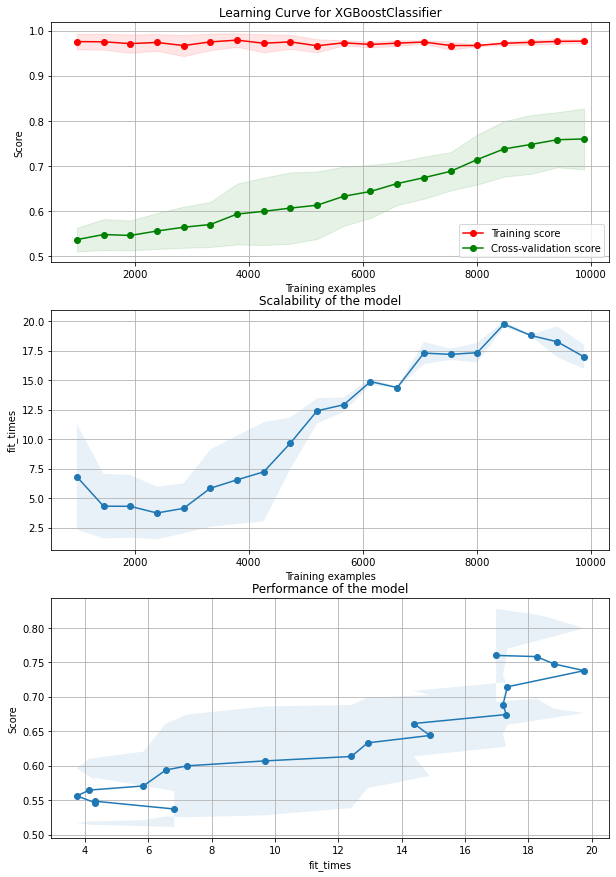

In [112]:
fig, axes = plt.subplots(3, 1, figsize=(10, 15))

title = "Learning Curve for XGBoostClassifier"
# Cross validation with 100 iterations to get smoother mean test and train
# score curves, each time with 20% data randomly selected as a validation set.
cv = ShuffleSplit(n_splits=100, test_size=0.2, random_state=0)

plot_learning_curve(estimator=gscv3.best_estimator_, title=title, X=train_df[input_cols], Y=train_df[target_col], axes=axes[:], cv=3, n_jobs=-1)

### Feature Importance

In [122]:
model = gscv3.best_estimator_

importance_df = pd.DataFrame({
    'feature': input_cols,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

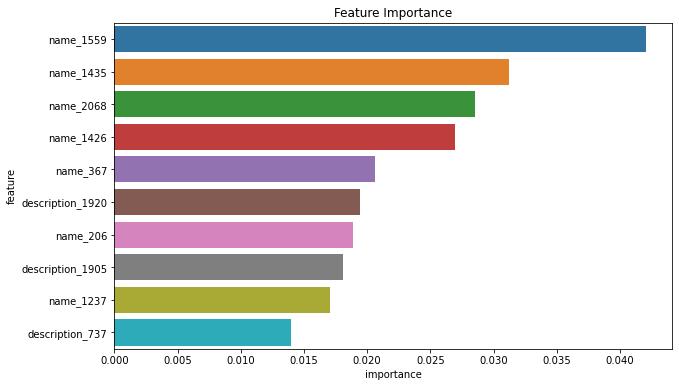

In [123]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.title('Feature Importance')
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

### Visualization

We can visualize individual trees using `plot_tree` (note: this requires the `graphviz` library to be installed).

In [124]:
import matplotlib.pyplot as plt
from xgboost import plot_tree
from matplotlib.pylab import rcParams
%matplotlib inline

rcParams['figure.figsize'] = 30,30

Notice how the trees only compute residuals, and not the actual target value. We can also visualize the tree as text.

In [129]:
trees = model.get_booster().get_dump()

In [130]:
len(trees)

100

In [131]:
print(trees[0])

0:[longitude<0.296033978] yes=1,no=2,missing=1
	1:[latitude<0.643999994] yes=3,no=4,missing=3
		3:[latitude<0.572000027] yes=7,no=8,missing=7
			7:[size<0.00728862965] yes=15,no=16,missing=15
				15:[height<0.647222221] yes=27,no=28,missing=27
					27:leaf=-1.54979634
					28:[longitude<0.245042488] yes=51,no=52,missing=51
						51:leaf=-1.30851614
						52:[height<0.668055534] yes=89,no=90,missing=89
							89:leaf=0.793655097
							90:[width<0.814583302] yes=153,no=154,missing=153
								153:leaf=0.611451685
								154:leaf=-0.409788489
				16:[width<0.529166698] yes=29,no=30,missing=29
					29:leaf=-1.34525037
					30:[latitude<0.351999998] yes=53,no=54,missing=53
						53:[size<0.0310981534] yes=91,no=92,missing=91
							91:[ratio_4:3<0.230350971] yes=155,no=156,missing=155
								155:leaf=-0.852381527
								156:leaf=0.688597441
							92:[width<0.6875] yes=157,no=158,missing=157
								157:leaf=-0.290363699
								158:leaf=-1.17742813
						54:[caption_792<0.5] yes=93,no=

Let's save our work before continuing.

In [132]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Updating notebook "ghanghavkunal/zerotogbms-project" on https://jovian.ai/
[jovian] Committed successfully! https://jovian.ai/ghanghavkunal/zerotogbms-project


'https://jovian.ai/ghanghavkunal/zerotogbms-project'

## Putting it Together and Making Predictions

Let's train a final model on the entire training set with custom hyperparameters. 

### Prepare Test Data

In [133]:
def one_hot_encode_test(df, cvec, col, feature_names):
    if not isinstance(cvec, OneHotEncoder):
        features = pd.DataFrame(cvec.transform(df[col]).toarray(), columns=feature_names)
    else:
        features = pd.DataFrame(cvec.transform(df[col].to_numpy().reshape(-1, 1)).toarray(), columns=feature_names)
    # Merge original df with new columns
    features = pd.concat([df, features], axis=1)
    return features

def preprocess_test(df):
    df = drop_columns(df, ["id"])

    df = fill_nulls(df, ["name", "description", "caption"])

    df["ratio"] = compute_ratio(df["width"], df["height"], eps=RATIO_EPS)
    df = one_hot_encode_test(df, cvec=ratio_encoder, col="ratio", feature_names=ratio_cols)
    df.drop("ratio", axis=1, inplace=True)

    df = one_hot_encode_test(df, cvec=name_cvec, col="name", feature_names=name_cols)
    df = one_hot_encode_test(df, cvec=description_cvec, col="description", feature_names=description_cols)
    df = one_hot_encode_test(df, cvec=caption_cvec, col="caption", feature_names=caption_cols)
    df[numeric_cols+categorical_cols] = scaler.transform(df[numeric_cols+categorical_cols])
    return df.reset_index(drop=True)

submission_df = preprocess_test(test_df)

In [134]:
submission_df.head()

,latitude,longitude,width,height,size,name,description,caption,ratio_16:9,ratio_1:1,ratio_3:2,ratio_4:3,ratio_other,name_1006,name_1009,name_1043,name_1048,name_1207,name_1237,name_1237 2002,name_1302,name_1393,name_1396,name_1426,name_1433,name_1435,name_1435 1499,name_1499,name_1527,name_1559,name_1560,name_1612,name_1766,name_1770,name_1782,name_1838,name_1897,name_1905,name_1976,name_20,name_2002,name_2013,name_2046,name_2046 1426,name_206,name_2068,name_2070,name_2107,name_361,name_367,name_432,name_432 1560,name_483,name_51,name_643,name_687,name_727,name_740,name_75,name_907,...,description_737,description_740,description_744,description_78,description_792,description_807,description_830,description_853,description_876,description_924,caption_1011,caption_1092,caption_1104,caption_1120,caption_1130,caption_1257,caption_128,caption_1302,caption_1309,caption_1318,caption_1333,caption_1348,caption_1363,caption_1365,caption_1369,caption_161,caption_1749,caption_1903,caption_1905,caption_1912,caption_1914,caption_1920,caption_1933,caption_2029,caption_2054,caption_2064,caption_2076,caption_2080,caption_2084,caption_2107,caption_2144,caption_22,caption_276,caption_297,caption_36,caption_483,caption_51,caption_540,caption_687,caption_712,caption_740,caption_763,caption_78,caption_792,caption_807,caption_830,caption_853,caption_875,caption_876,caption_891
0,0.712,0.161473,0.888889,0.663889,0.000000,51 125,,1481 1905 2060 2071 483,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.712,0.260623,0.573611,0.838889,0.010690,744,749 1905 36 740 1433,,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.776,0.249292,1.000000,0.666667,0.041788,2102 670,2040 643 594 297 1881 737 1304 2102 2136 712 1...,807 142,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,0.872,0.490085,0.838889,0.629167,0.016521,1744,,,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.600,0.713881,0.838889,0.562500,0.057337,193 944,,,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Predict

In [135]:
model = gscv3.best_estimator_

In [136]:
%%time
model.fit(train_df[input_cols], train_df[target_col])

Wall time: 7.46 s


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='logloss',
              gamma=1, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.7943282347242815,
              max_delta_step=0, max_depth=12, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=-1,
              num_parallel_tree=1, objective='binary:logitraw', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1.0,
              tree_method='exact', use_label_encoder=False,
              validate_parameters=1, verbosity=None)

Now that the model is trained, we can make predictions on the test set.

In [137]:
test_preds = model.predict(submission_df[input_cols])

Let's add the predictions into `test_df`.

In [138]:
test_df[target_col]  = test_preds

In [139]:
test_df.head()

,id,latitude,longitude,width,height,size,name,description,caption,good
0,40265,34,-118,640,478,1,51 125,NaN,1481 1905 2060 2071 483,0
1,40266,34,-83,413,604,12,744,749 1905 36 740 1433,NaN,0
2,40267,42,-87,720,480,44,2102 670,2040 643 594 297 1881 737 1304 2102 2136 712 1...,807 142,0
3,40268,54,-2,604,453,18,1744,NaN,NaN,1
4,40269,20,77,604,405,60,193 944,NaN,NaN,1


We can now save the predictions as a CSV file.

In [140]:
test_df.to_csv('submission.csv', index=None)

In [141]:
from IPython.display import FileLink

In [142]:
# Doesn't work on Colab, use the file browser instead.
FileLink('submission.csv')

C:\Users\Kunal Ghanghav\0. Jovian zerotogbm\submission.csv

In [143]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Updating notebook "ghanghavkunal/zerotogbms-project" on https://jovian.ai/
[jovian] Committed successfully! https://jovian.ai/ghanghavkunal/zerotogbms-project


'https://jovian.ai/ghanghavkunal/zerotogbms-project'

## Further Development

One good idea should be to include some *geodata* using **geopandas** and **geopy** libraries, exploiting the information of latitude and longitude

In [146]:
# !pip install --upgrade -q geopy geopandas

In [147]:
# import geopandas as gpd
# import geopy
# from geopy.geocoders import Nominatim
# from geopy.extra.rate_limiter import RateLimiter

In [148]:
# locator = Nominatim(user_agent="myGeocoder")
# #coordinates = "53.480837, -2.244914"
# idx = 1
# coordinates = str(test_df.loc[idx, "latitude"]) + ", " + str(test_df.loc[idx, "longitude"])
# location = locator.reverse(coordinates)
# location.raw

## Conclusion and References

![](https://miro.medium.com/max/560/1*85QHtH-49U7ozPpmA5cAaw.png)

The following topics were covered in project:

- Downloading a real-world dataset from a Kaggle competition
- Performing feature engineering and prepare the dataset for training and test
- Hyperparameter Tuning, Training and Interpreting a gradient boosting model using XGBoost and a simpler Decision Tree
- Training with KFold cross validation and ensembling results
- Configuring the gradient boosting model and tuning hyperparamters

### Conclusions

As stated by the creator of the Kaggle competition, the aim of the project is to `automatically pick out particularly enjoyable or impressive ones to highlight, especially travel-related, using only the meta-data associated with the images such as caption text, image dimensions and approximate location in the world. [...] The main goal of this exercise is to ensure that there's not enough information to reconstruct the text, whilst still having enough content for a prediction algorithm to sink its teeth into.`.
The results we've obtained perfectly represtents the author's statement, as our best model (*XGBClassifier*) reached and average accuracy of around 70%, only sighly better than a single Decision Tree.

This tells us mainly two things:
- The information which are given for the classification task are not sufficient to perfectly determine if a photo is of "good quality" (clearly pixels information would increase the performances of the models, which are not provided because the model they wanted should be fast in his prediction at a large scale).
- Both Decision Tree and XGBoost have similar performances, which results in Decision Tree being preferable as more fast in its training and predictions, with the only drawbacks of a mere 1% in accuracy.

As further developments, new features could be inferred from the original data (for example, the country in which the photo is taken) and the use of non ensemble models as Deep Learning models and Kernel models (e.g. SVC).

Check out these resources which have been used to get these results: 
- https://albertum.medium.com/l1-l2-regularization-in-xgboost-regression-7b2db08a59e0
- https://machinelearningmastery.com/evaluate-gradient-boosting-models-xgboost-python/
- https://xgboost.readthedocs.io/en/latest/python/python_api.html#xgboost.XGBClassifier
- https://xgboost.readthedocs.io/en/latest/parameter.html
- https://machinelearningmastery.com/learning-curves-for-diagnosing-machine-learning-model-performance/

In [ ]:
jovian.commit()

<IPython.core.display.Javascript object>